In [74]:
import pandas as pd
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px

In [75]:
def remove_dollar_sign(value):
    if pd.isna(value):
        return np.NaN
    else:
        return float(value.replace("$", "").replace(",", "").replace(" ", ""))


def no_values(val):
    if pd.isna(val):
        return np.NaN


In [76]:
df = pd.read_csv('/home/julia/Documents/TUE/Year 2/Quartile 2/Visualizations/Data Sets/Airbnb/airbnb_open_data.csv', low_memory=False)

In [77]:
df.columns = [col.lower().replace(" ", "_") for col in df.columns]

print(df.columns)

Index(['id', 'name', 'host_id', 'host_identity_verified', 'host_name',
       'neighbourhood_group', 'neighbourhood', 'lat', 'long', 'country',
       'country_code', 'instant_bookable', 'cancellation_policy', 'room_type',
       'construction_year', 'price', 'service_fee', 'minimum_nights',
       'number_of_reviews', 'last_review', 'reviews_per_month',
       'review_rate_number', 'calculated_host_listings_count',
       'availability_365', 'house_rules', 'license'],
      dtype='object')


In [78]:
df['neighbourhood_group'] = df['neighbourhood_group'].replace(['brookln'], 'Brooklyn')
df['neighbourhood_group'] = df['neighbourhood_group'].replace(['manhatan'], 'Manhattan')

In [79]:
df["price"] = df["price"].apply(lambda x: remove_dollar_sign(x))
df["service_fee"] = df["service_fee"].apply(lambda x: remove_dollar_sign(x))
df["host_identity_verified"] = df["host_identity_verified"].apply(lambda x: no_values(x))
df["neighbourhood"] = df["neighbourhood"].apply(lambda x: no_values(x))
df["country"] = df["country"].apply(lambda x: no_values(x))
df["cancellation_policy"] = df["cancellation_policy"].apply(lambda x: no_values(x))
df["last_review"] = df["last_review"].apply(lambda x: no_values(x))
df["calculated_host_listings_count"] = df["calculated_host_listings_count"].apply(lambda x: no_values(x))
df["license"] = df["license"].apply(lambda x: no_values(x))

<AxesSubplot: xlabel='long', ylabel='lat'>

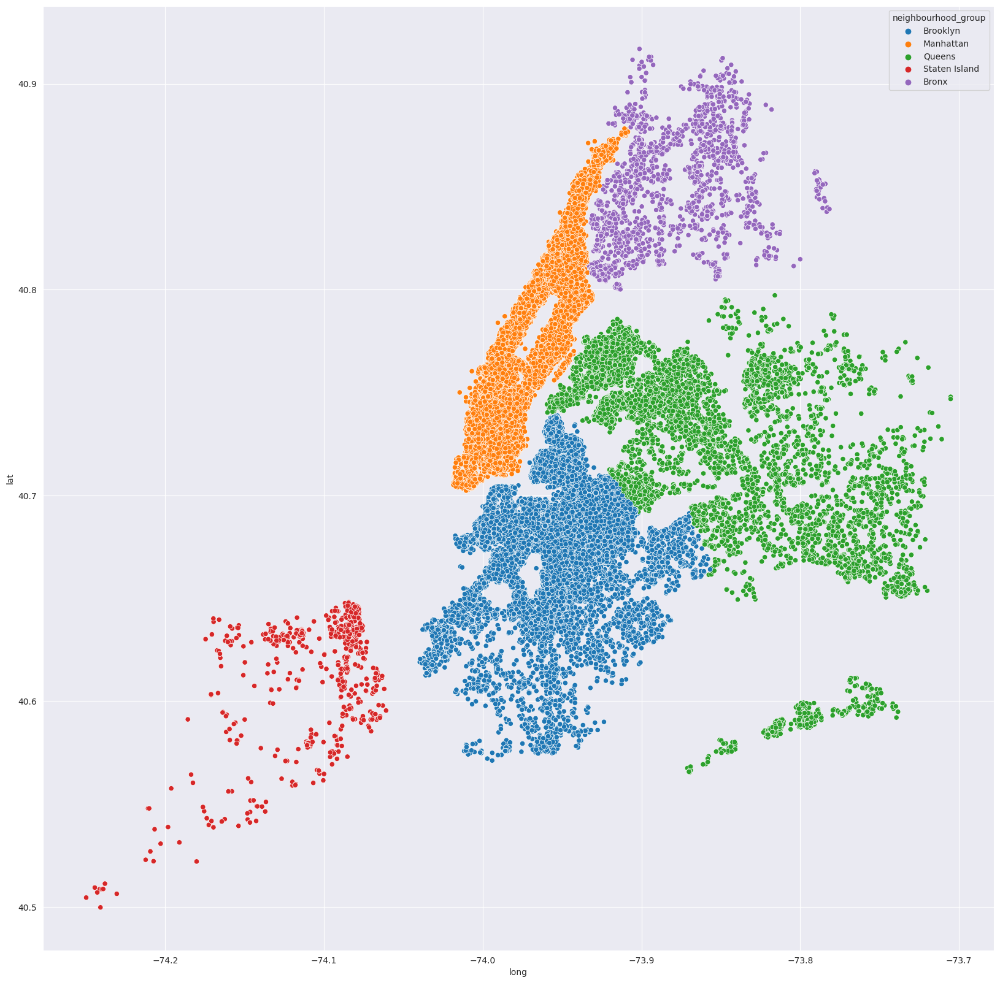

In [80]:
plt.figure(figsize=(20,20))
sns.scatterplot(x='long', y='lat', hue='neighbourhood_group', data=df)

In [81]:

# Using DataFrame.filter() method.
brooklyn = df[df["neighbourhood_group"]=="Brooklyn"].filter(['price','lat', 'long', 'id'], axis=1)
brooklyn

,price,lat,long,id
0,966.0,40.64749,-73.97237,1001254
3,368.0,40.68514,-73.95976,1002755
6,71.0,40.68688,-73.95596,1004650
7,1060.0,40.68688,-73.95596,1005202
13,580.0,40.66829,-73.98779,1008516
...,...,...,...,...
102587,388.0,40.71687,-73.94656,6088571
102589,306.0,40.65231,-73.96189,6089676
102590,250.0,40.66673,-73.96127,6090228
102594,844.0,40.70862,-73.94651,6092437


In [82]:
px.density_mapbox(brooklyn, "lat", "long", z="price", mapbox_style="stamen-terrain")

In [83]:
trial = df.filter(['price','lat', 'long', 'id'], axis=1)

In [84]:
px.density_mapbox(trial, "lat", "long", z="price", mapbox_style="stamen-terrain")